# Analyse

In [27]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import spacy
from spacytextblob.spacytextblob import SpacyTextBlob

In [24]:
# Lade die CSV-Dateien
mittweida_df = pd.read_csv('medienmanagement_mittweida_reviews.csv')
hdm_omm_df = pd.read_csv('online_medien-management_hdm_reviews.csv')
macromedia_df = pd.read_csv('medien-_und_kommunikationsmanagement_macromedia_hochschule_reviews.csv')
hdm_mw_df = pd.read_csv('digital_und_medienwirtschaft_hdm_reviews.csv')

# Füge eine Spalte für den Studiengang hinzu
mittweida_df['Studiengang'] = 'Medienmanagement Mittweida'
hdm_omm_df['Studiengang'] = 'Online Medien-Management HdM'
macromedia_df['Studiengang'] = 'Medien- und Kommunikationsmanagement Macromedia Hochschule'
hdm_mw_df['Studiengang'] = 'Digital und Medienwirtschaft HdM'

# Kombiniere die DataFrames für die Analyse
all_reviews_df = pd.concat([mittweida_df, hdm_omm_df, macromedia_df, hdm_mw_df], ignore_index=True)


In [25]:
# Herunterladen der NLTK-Resourcen
nltk.download('punkt')
nltk.download('stopwords')

# Text bereinigen
def clean_text(text):
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word.lower() not in stopwords.words('german')]
    tokens = [word for word in tokens if word.isalnum()]
    return ' '.join(tokens)

all_reviews_df['cleaned_review'] = all_reviews_df['Review'].apply(clean_text)


[nltk_data] Downloading package punkt to /Users/jankirenz/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jankirenz/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [29]:

# Lade das deutsche Sprachmodell
nlp = spacy.load('de_core_news_sm')

# Füge die SpacyTextBlob-Komponente hinzu
spacy_text_blob = SpacyTextBlob(nlp)
nlp.add_pipe('spacytextblob')

# Sentiment-Analyse
def get_sentiment(text):
    doc = nlp(text)
    return doc._.polarity

all_reviews_df['sentiment'] = all_reviews_df['cleaned_review'].apply(get_sentiment)


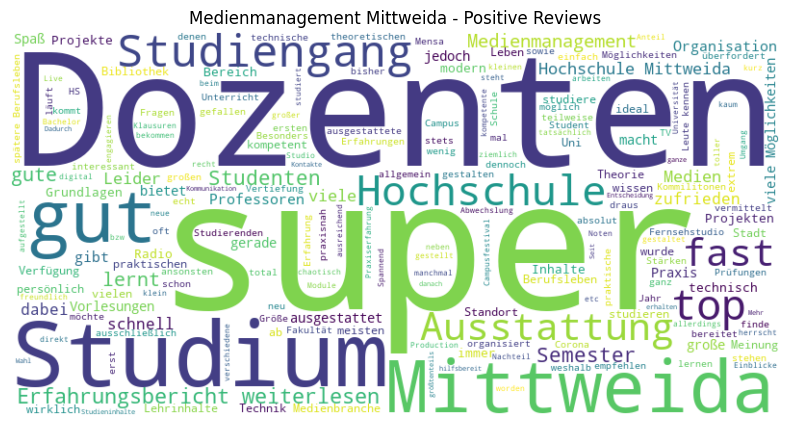

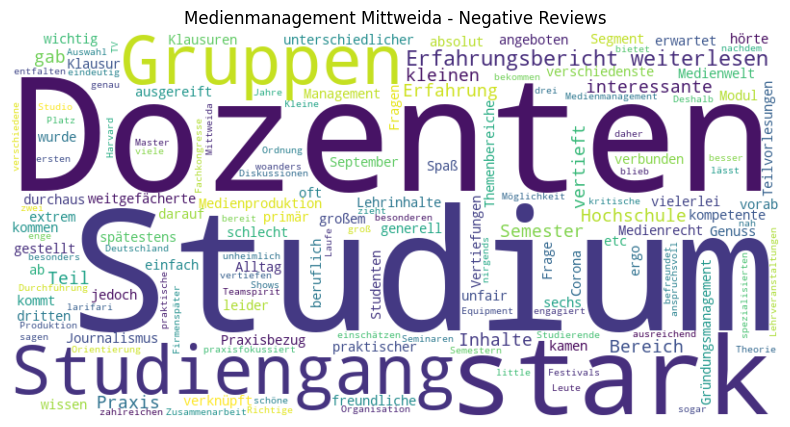

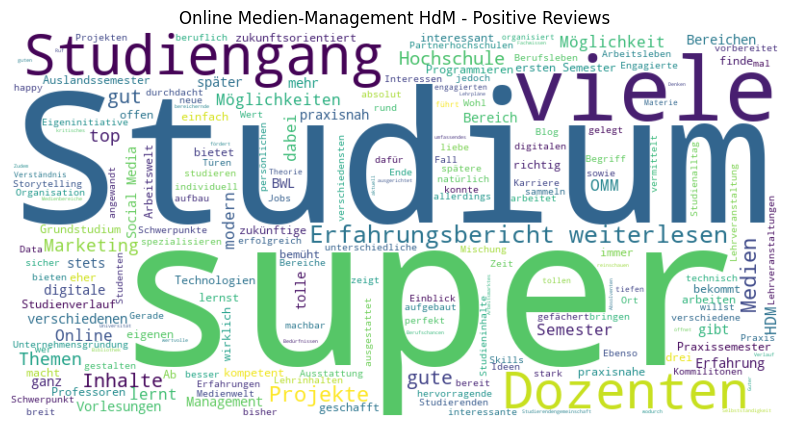

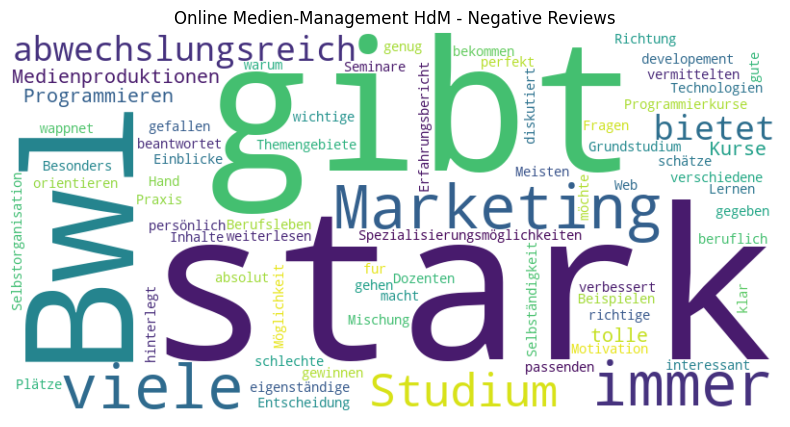

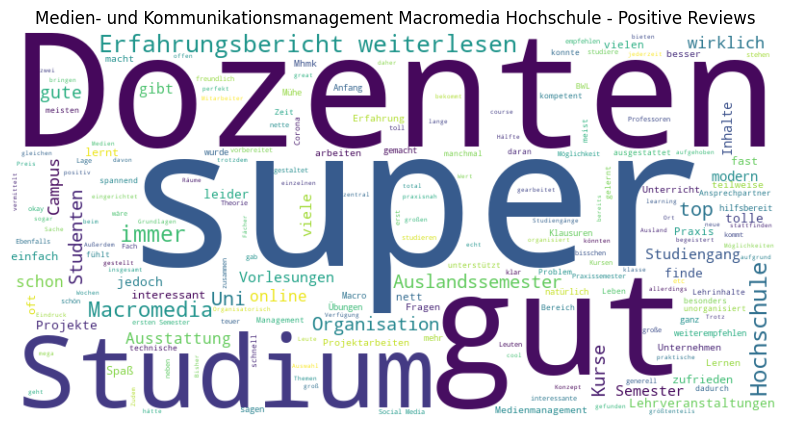

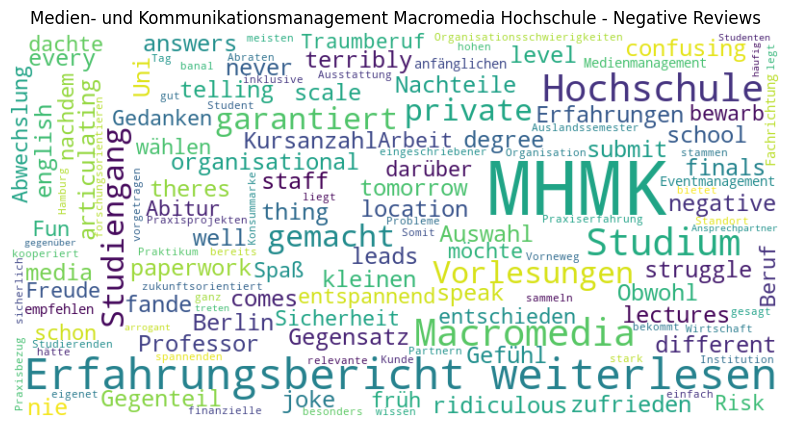

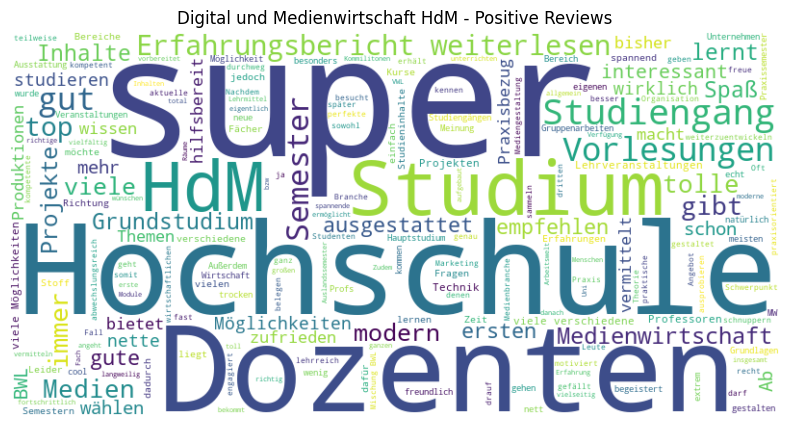

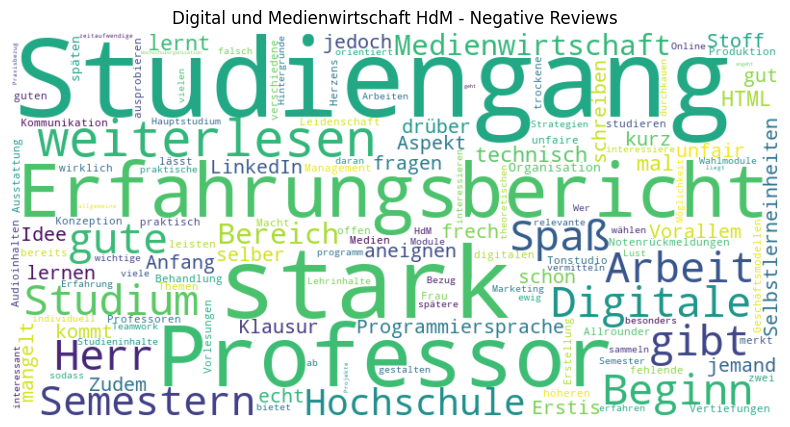

In [30]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def generate_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Positive und negative Bewertungen trennen
for studiengang in all_reviews_df['Studiengang'].unique():
    pos_reviews = ' '.join(all_reviews_df[(all_reviews_df['Studiengang'] == studiengang) & (all_reviews_df['sentiment'] > 0)]['cleaned_review'])
    neg_reviews = ' '.join(all_reviews_df[(all_reviews_df['Studiengang'] == studiengang) & (all_reviews_df['sentiment'] < 0)]['cleaned_review'])
    
    # Wortwolke für positive Bewertungen
    generate_wordcloud(pos_reviews, f'{studiengang} - Positive Reviews')
    
    # Wortwolke für negative Bewertungen
    generate_wordcloud(neg_reviews, f'{studiengang} - Negative Reviews')


[nltk_data] Downloading package punkt to /Users/jankirenz/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jankirenz/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


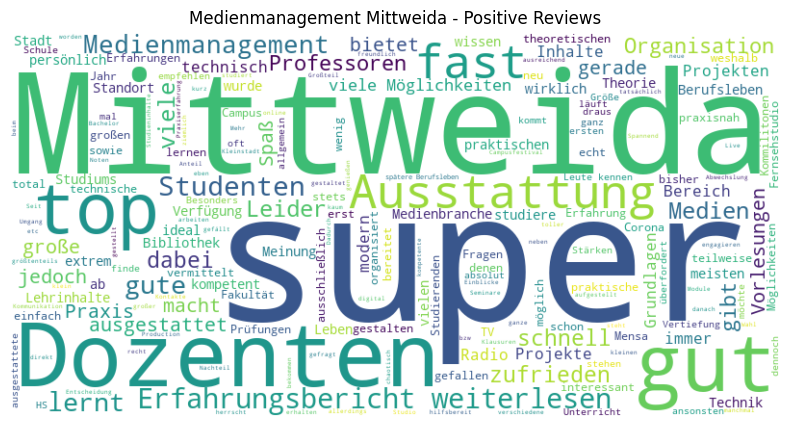

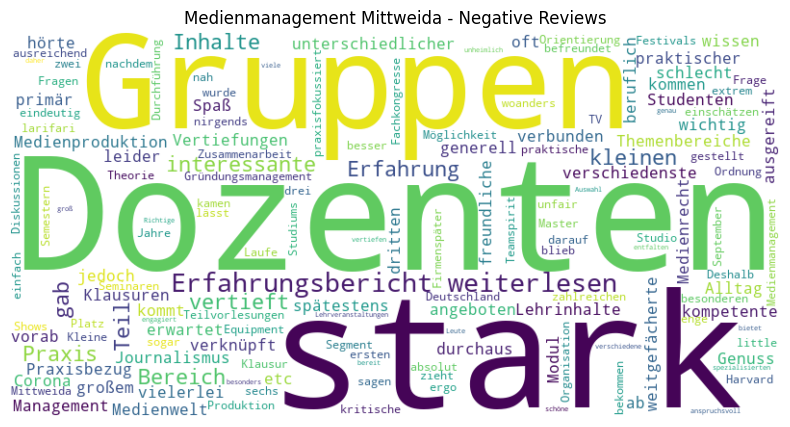

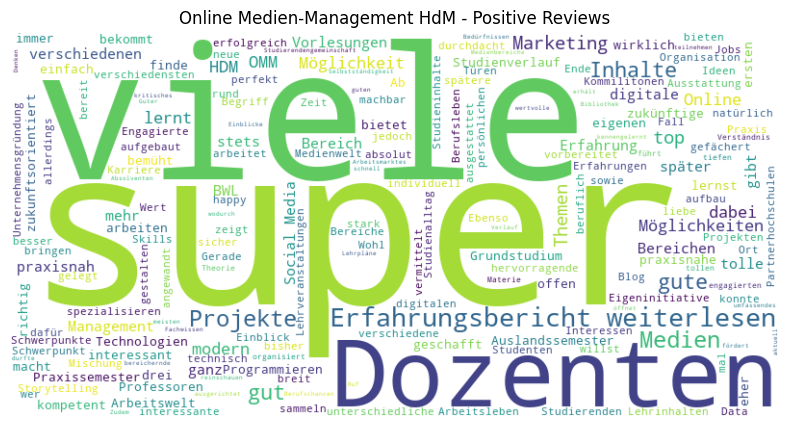

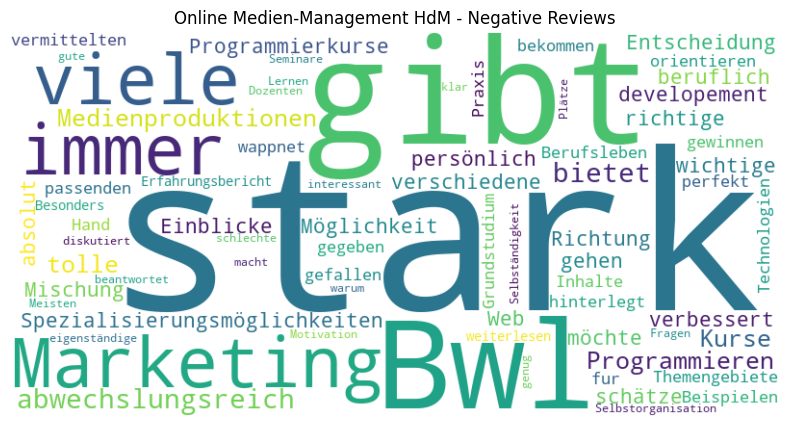

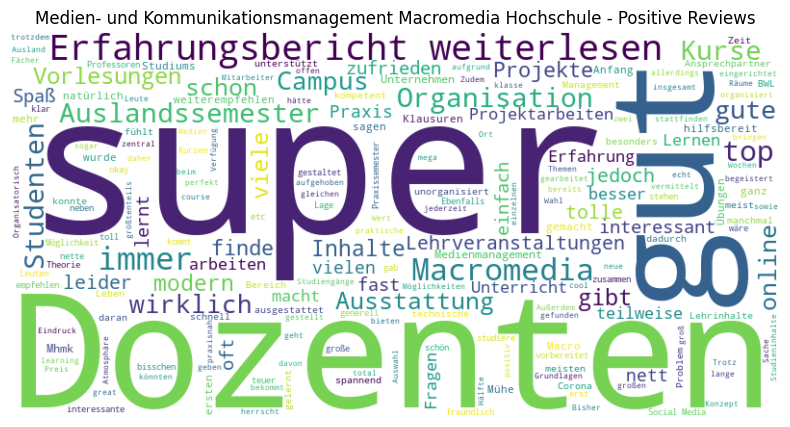

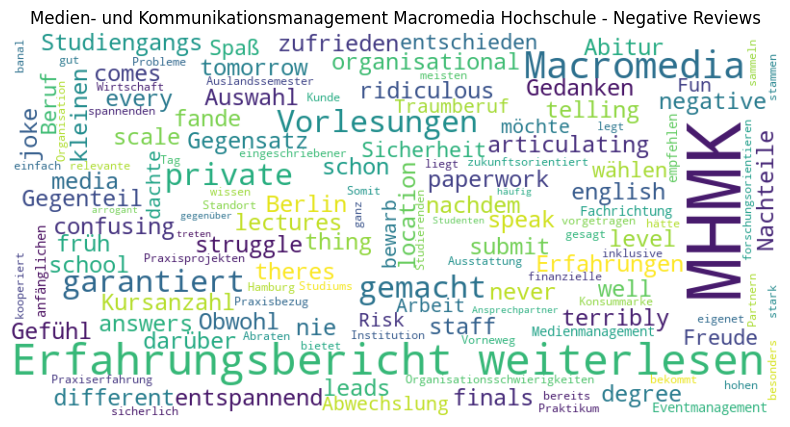

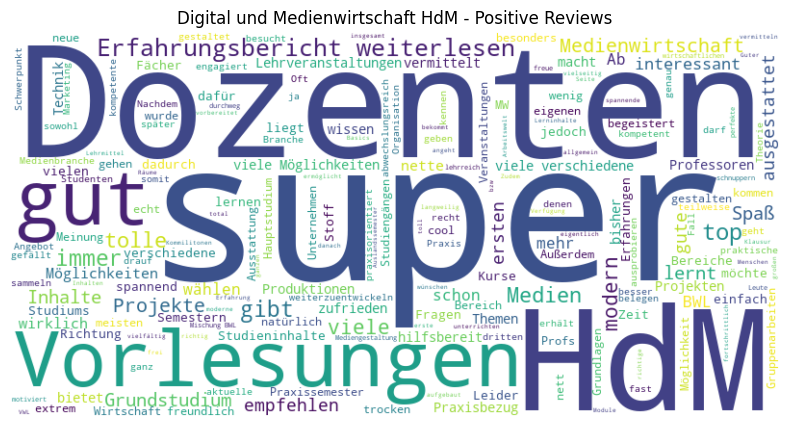

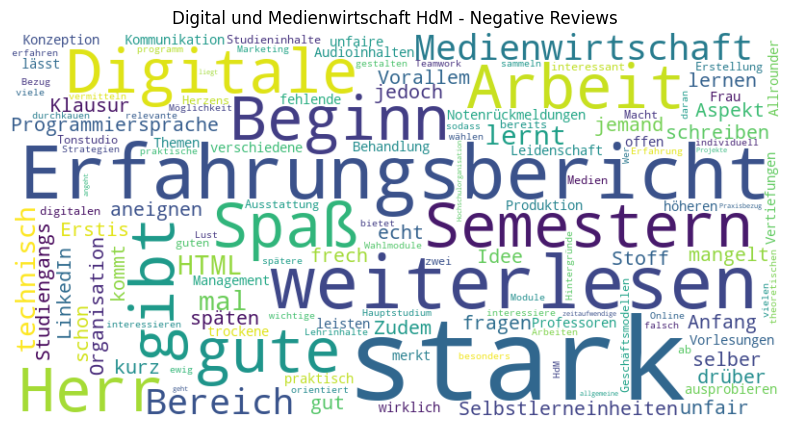

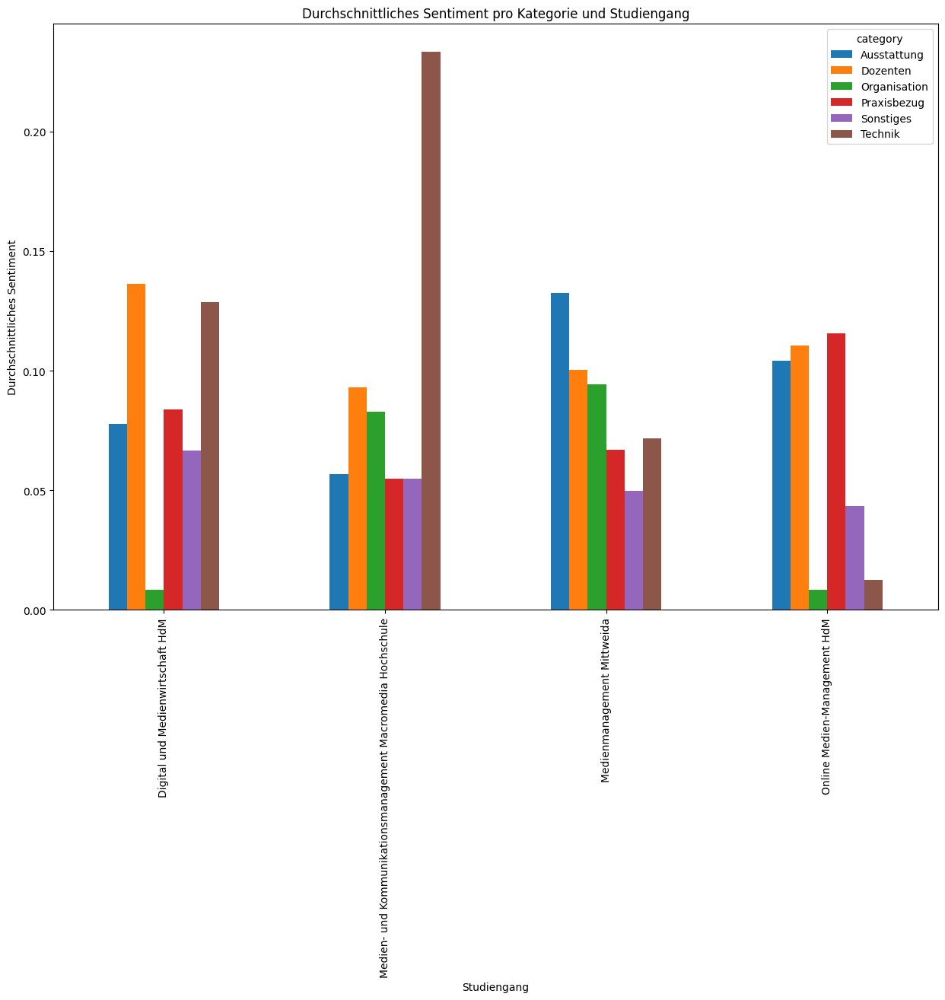

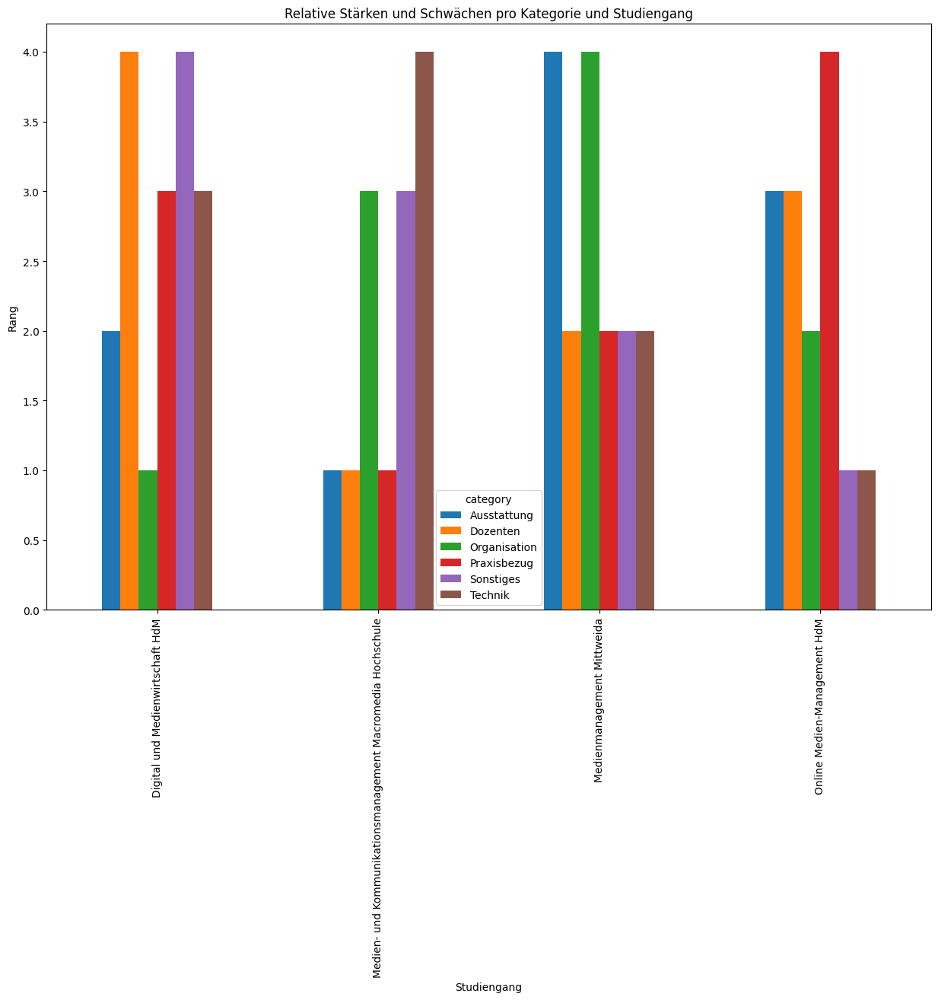

Analyse abgeschlossen und Ergebnisse gespeichert.


In [32]:
# Import der erforderlichen Bibliotheken gemäß PEP8
import pandas as pd
import nltk
import spacy
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from spacytextblob.spacytextblob import SpacyTextBlob
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Herunterladen der NLTK-Ressourcen
nltk.download('punkt')
nltk.download('stopwords')

# Zusätzliche Stopwörter definieren
additional_stopwords = set(['studium', 'studiengang', 'hochschule', 'uni', 'universität', 'semester', 'student', 'studieren', 'studierende', 'fach', 'lehrveranstaltung', 'professor', 'dozent'])

# Textbereinigungsfunktion
def clean_text(text):
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word.lower() not in stopwords.words('german')]
    tokens = [word for word in tokens if word.lower() not in additional_stopwords]
    tokens = [word for word in tokens if word.isalnum()]
    return ' '.join(tokens)

# Funktion zur Generierung von Wortwolken
def generate_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Lade die CSV-Dateien
mittweida_df = pd.read_csv('medienmanagement_mittweida_reviews.csv')
hdm_omm_df = pd.read_csv('online_medien-management_hdm_reviews.csv')
macromedia_df = pd.read_csv('medien-_und_kommunikationsmanagement_macromedia_hochschule_reviews.csv')
hdm_mw_df = pd.read_csv('digital_und_medienwirtschaft_hdm_reviews.csv')

# Füge eine Spalte für den Studiengang hinzu
mittweida_df['Studiengang'] = 'Medienmanagement Mittweida'
hdm_omm_df['Studiengang'] = 'Online Medien-Management HdM'
macromedia_df['Studiengang'] = 'Medien- und Kommunikationsmanagement Macromedia Hochschule'
hdm_mw_df['Studiengang'] = 'Digital und Medienwirtschaft HdM'

# Kombiniere die DataFrames für die Analyse
all_reviews_df = pd.concat([mittweida_df, hdm_omm_df, macromedia_df, hdm_mw_df], ignore_index=True)

# Bereinige die Texte in den Reviews
all_reviews_df['cleaned_review'] = all_reviews_df['Review'].apply(clean_text)

# Lade das deutsche Sprachmodell und füge die SpacyTextBlob-Komponente hinzu
nlp = spacy.load('de_core_news_sm')
spacy_text_blob = SpacyTextBlob(nlp)
nlp.add_pipe('spacytextblob')

# Sentiment-Analyse-Funktion
def get_sentiment(text):
    doc = nlp(text)
    return doc._.polarity

# Führe die Sentiment-Analyse durch
all_reviews_df['sentiment'] = all_reviews_df['cleaned_review'].apply(get_sentiment)

# Positive und negative Bewertungen trennen und Wortwolken erstellen
for studiengang in all_reviews_df['Studiengang'].unique():
    pos_reviews = ' '.join(all_reviews_df[(all_reviews_df['Studiengang'] == studiengang) & (all_reviews_df['sentiment'] > 0)]['cleaned_review'])
    neg_reviews = ' '.join(all_reviews_df[(all_reviews_df['Studiengang'] == studiengang) & (all_reviews_df['sentiment'] < 0)]['cleaned_review'])
    
    # Wortwolke für positive Bewertungen
    generate_wordcloud(pos_reviews, f'{studiengang} - Positive Reviews')
    
    # Wortwolke für negative Bewertungen
    generate_wordcloud(neg_reviews, f'{studiengang} - Negative Reviews')

# Kategorisierung der Bewertungen
categories = ['Dozenten', 'Technik', 'Ausstattung', 'Organisation', 'Praxisbezug']
category_keywords = {
    'Dozenten': ['dozent', 'professor', 'lehrkraft'],
    'Technik': ['technik', 'computer', 'software', 'hardware'],
    'Ausstattung': ['ausstattung', 'raum', 'labor', 'bibliothek'],
    'Organisation': ['organisation', 'verwaltung', 'koordinierung'],
    'Praxisbezug': ['praxis', 'projekt', 'praktikum', 'anwendung']
}

# Funktion zur Kategorisierung der Bewertungen
def categorize_review(review):
    for category, keywords in category_keywords.items():
        if any(keyword in review.lower() for keyword in keywords):
            return category
    return 'Sonstiges'

all_reviews_df['category'] = all_reviews_df['cleaned_review'].apply(categorize_review)

# Durchschnittliches Sentiment pro Kategorie und Studiengang
category_sentiment = all_reviews_df.groupby(['Studiengang', 'category'])['sentiment'].mean().unstack()

# Visualisierung der durchschnittlichen Sentiments pro Kategorie und Studiengang
category_sentiment.plot(kind='bar', figsize=(15, 10))
plt.title('Durchschnittliches Sentiment pro Kategorie und Studiengang')
plt.xlabel('Studiengang')
plt.ylabel('Durchschnittliches Sentiment')
plt.show()

# Relative Gegenüberstellung der Bewertungen
relative_strengths = all_reviews_df.groupby(['Studiengang', 'category'])['sentiment'].mean().unstack().rank(axis=0)

# Visualisierung der relativen Stärken und Schwächen
relative_strengths.plot(kind='bar', figsize=(15, 10))
plt.title('Relative Stärken und Schwächen pro Kategorie und Studiengang')
plt.xlabel('Studiengang')
plt.ylabel('Rang')
plt.show()

# Speichere die Ergebnisse in einer CSV-Datei
all_reviews_df.to_csv('all_reviews_with_sentiment_and_categories.csv', index=False)
print("Analyse abgeschlossen und Ergebnisse gespeichert.")


[nltk_data] Downloading package punkt to /Users/jankirenz/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jankirenz/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


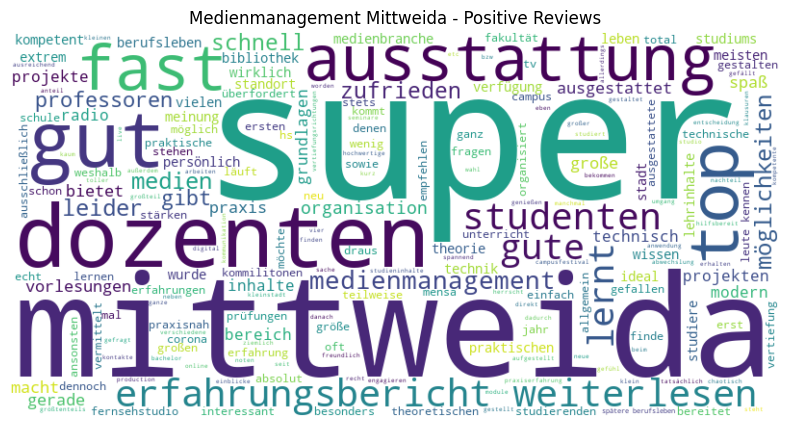

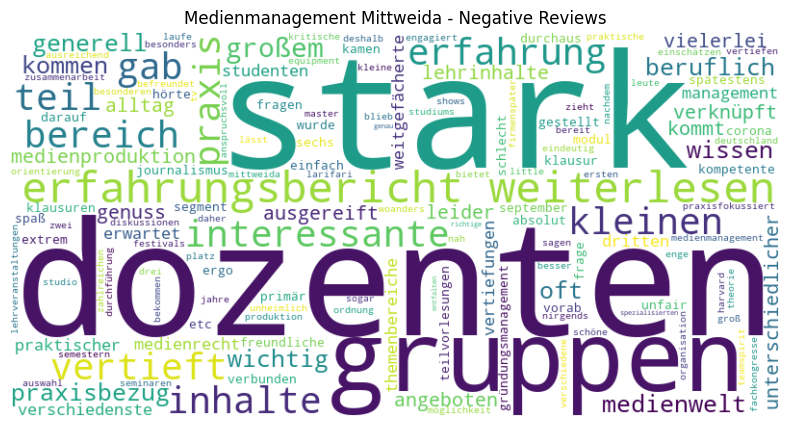

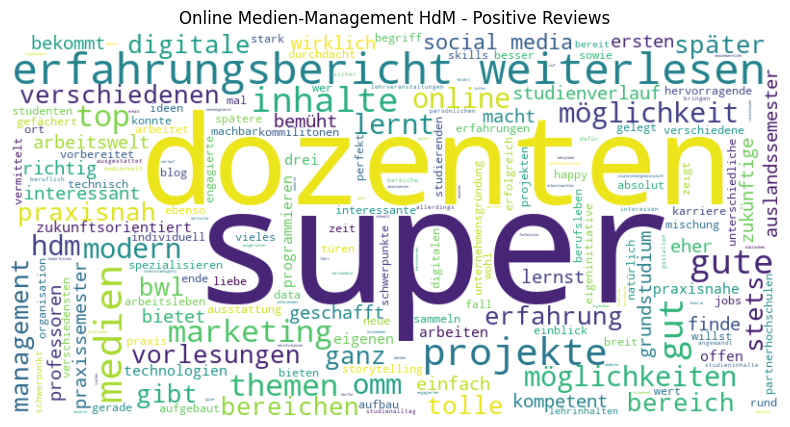

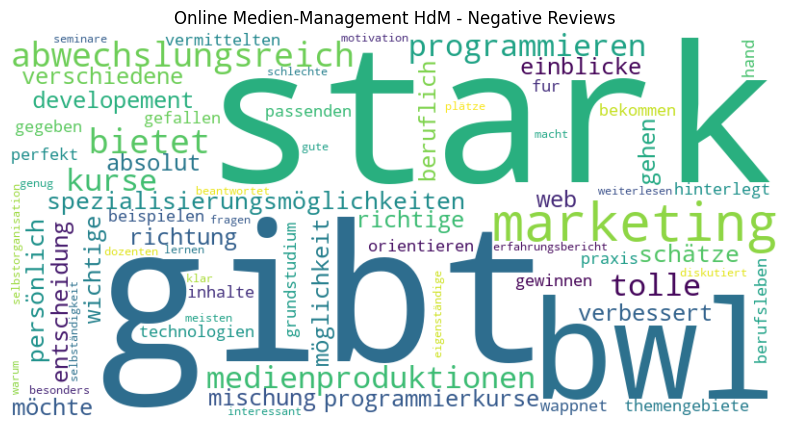

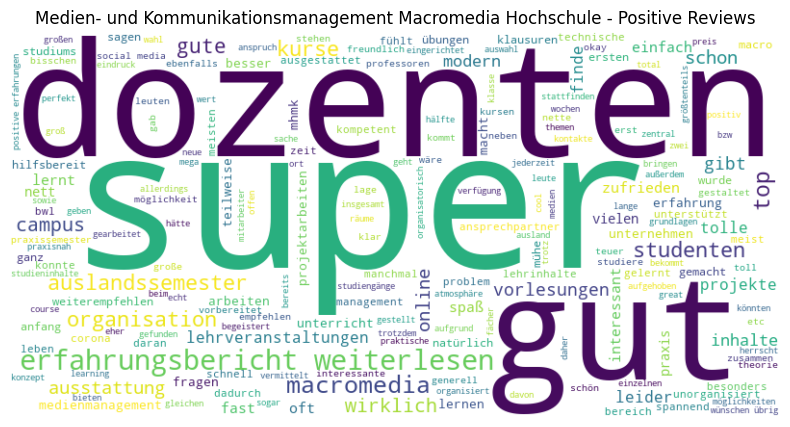

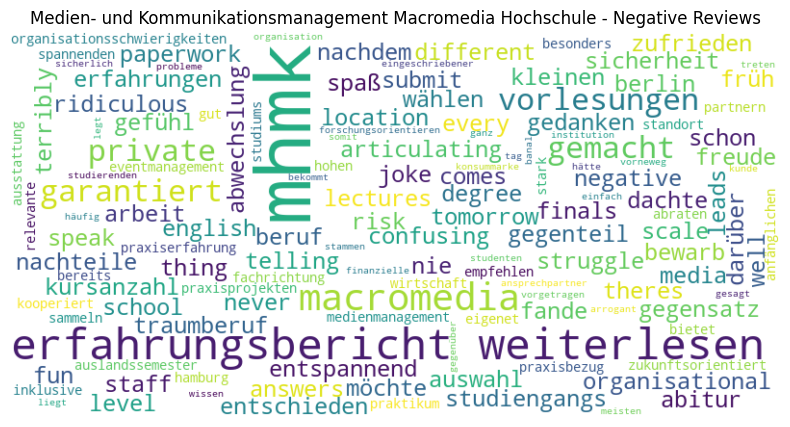

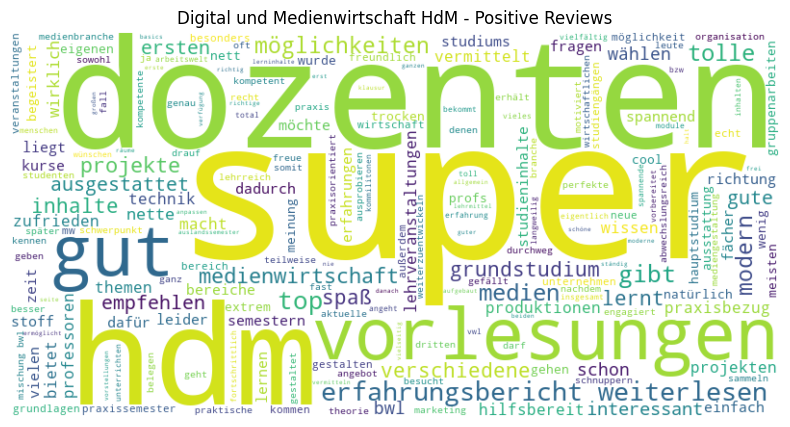

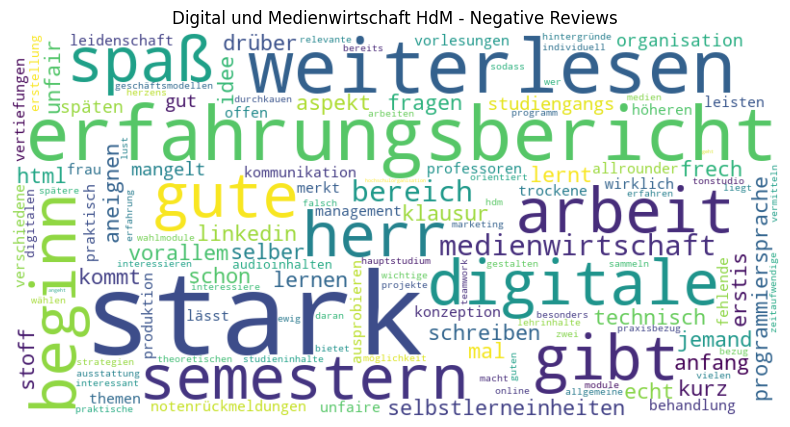

alt.Chart(...)

alt.Chart(...)

Analyse abgeschlossen und Ergebnisse gespeichert.


In [34]:
# Import der erforderlichen Bibliotheken gemäß PEP8
import pandas as pd
import nltk
import spacy
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from spacytextblob.spacytextblob import SpacyTextBlob
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import altair as alt

# Herunterladen der NLTK-Ressourcen
nltk.download('punkt')
nltk.download('stopwords')

# Zusätzliche Stopwörter definieren
additional_stopwords = set([
    'studium', 'studiengang', 'hochschule', 'uni', 'universität', 'semester', 
    'student', 'studieren', 'studierende', 'fach', 'lehrveranstaltung', 'professor', 
    'dozent', 'viele', 'dabei', 'ab', 'jedoch', 'auch', 'immer', 'während', 'mehr', 
    'bisher', 'obwohl', 'zudem'
])

# Textbereinigungsfunktion
def clean_text(text):
    tokens = word_tokenize(text.lower())
    tokens = [word for word in tokens if word not in stopwords.words('german')]
    tokens = [word for word in tokens if word not in additional_stopwords]
    tokens = [word for word in tokens if word.isalnum()]
    return ' '.join(tokens)

# Funktion zur Generierung von Wortwolken
def generate_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Lade die CSV-Dateien
mittweida_df = pd.read_csv('medienmanagement_mittweida_reviews.csv')
hdm_omm_df = pd.read_csv('online_medien-management_hdm_reviews.csv')
macromedia_df = pd.read_csv('medien-_und_kommunikationsmanagement_macromedia_hochschule_reviews.csv')
hdm_mw_df = pd.read_csv('digital_und_medienwirtschaft_hdm_reviews.csv')

# Füge eine Spalte für den Studiengang hinzu
mittweida_df['Studiengang'] = 'Medienmanagement Mittweida'
hdm_omm_df['Studiengang'] = 'Online Medien-Management HdM'
macromedia_df['Studiengang'] = 'Medien- und Kommunikationsmanagement Macromedia Hochschule'
hdm_mw_df['Studiengang'] = 'Digital und Medienwirtschaft HdM'

# Kombiniere die DataFrames für die Analyse
all_reviews_df = pd.concat([mittweida_df, hdm_omm_df, macromedia_df, hdm_mw_df], ignore_index=True)

# Bereinige die Texte in den Reviews
all_reviews_df['cleaned_review'] = all_reviews_df['Review'].apply(clean_text)

# Lade das deutsche Sprachmodell und füge die SpacyTextBlob-Komponente hinzu
nlp = spacy.load('de_core_news_sm')
spacy_text_blob = SpacyTextBlob(nlp)
nlp.add_pipe('spacytextblob')

# Sentiment-Analyse-Funktion
def get_sentiment(text):
    doc = nlp(text)
    return doc._.polarity

# Führe die Sentiment-Analyse durch
all_reviews_df['sentiment'] = all_reviews_df['cleaned_review'].apply(get_sentiment)

# Positive und negative Bewertungen trennen und Wortwolken erstellen
for studiengang in all_reviews_df['Studiengang'].unique():
    pos_reviews = ' '.join(all_reviews_df[(all_reviews_df['Studiengang'] == studiengang) & (all_reviews_df['sentiment'] > 0)]['cleaned_review'])
    neg_reviews = ' '.join(all_reviews_df[(all_reviews_df['Studiengang'] == studiengang) & (all_reviews_df['sentiment'] < 0)]['cleaned_review'])
    
    # Wortwolke für positive Bewertungen
    generate_wordcloud(pos_reviews, f'{studiengang} - Positive Reviews')
    
    # Wortwolke für negative Bewertungen
    generate_wordcloud(neg_reviews, f'{studiengang} - Negative Reviews')

# Kategorisierung der Bewertungen
categories = ['Dozenten', 'Technik', 'Ausstattung', 'Organisation', 'Praxisbezug']
category_keywords = {
    'Dozenten': ['dozent', 'professor', 'lehrkraft'],
    'Technik': ['technik', 'computer', 'software', 'hardware'],
    'Ausstattung': ['ausstattung', 'raum', 'labor', 'bibliothek'],
    'Organisation': ['organisation', 'verwaltung', 'koordinierung'],
    'Praxisbezug': ['praxis', 'projekt', 'praktikum', 'anwendung']
}

# Funktion zur Kategorisierung der Bewertungen
def categorize_review(review):
    for category, keywords in category_keywords.items():
        if any(keyword in review.lower() for keyword in keywords):
            return category
    return 'Sonstiges'

all_reviews_df['category'] = all_reviews_df['cleaned_review'].apply(categorize_review)

# Durchschnittliches Sentiment pro Kategorie und Studiengang
category_sentiment = all_reviews_df.groupby(['Studiengang', 'category'])['sentiment'].mean().unstack()

# Visualisierung der durchschnittlichen Sentiments pro Kategorie und Studiengang mit Altair
category_sentiment_reset = category_sentiment.reset_index().melt(id_vars='Studiengang', var_name='Kategorie', value_name='Sentiment')

bar_chart = alt.Chart(category_sentiment_reset).mark_bar().encode(
    x=alt.X('Kategorie:N', title='Kategorie'),
    y=alt.Y('Sentiment:Q', title='Durchschnittliches Sentiment'),
    color='Studiengang:N',
    column='Studiengang:N'
).properties(
    title='Durchschnittliches Sentiment pro Kategorie und Studiengang'
).configure_title(
    fontSize=20,
    anchor='start',
    color='gray'
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

bar_chart.display()

# Relative Gegenüberstellung der Bewertungen
relative_strengths = all_reviews_df.groupby(['Studiengang', 'category'])['sentiment'].mean().unstack().rank(axis=0)

# Visualisierung der relativen Stärken und Schwächen mit Altair
relative_strengths_reset = relative_strengths.reset_index().melt(id_vars='Studiengang', var_name='Kategorie', value_name='Rang')

heatmap = alt.Chart(relative_strengths_reset).mark_rect().encode(
    x=alt.X('Kategorie:N', title='Kategorie'),
    y=alt.Y('Studiengang:N', title='Studiengang'),
    color=alt.Color('Rang:Q', scale=alt.Scale(scheme='viridis'), title='Rang'),
    tooltip=['Studiengang', 'Kategorie', 'Rang']
).properties(
    title='Relative Stärken und Schwächen pro Kategorie und Studiengang'
).configure_title(
    fontSize=20,
    anchor='start',
    color='gray'
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

heatmap.display()

# Speichere die Ergebnisse in einer CSV-Datei
all_reviews_df.to_csv('all_reviews_with_sentiment_and_categories.csv', index=False)
print("Analyse abgeschlossen und Ergebnisse gespeichert.")


[nltk_data] Downloading package punkt to /Users/jankirenz/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jankirenz/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Manuelle Überprüfung einiger Bewertungen:
15     Interessantes Studium mit großem Praxisbezug. ...
55     Die Lehrinhalte sind sehr stark mit dem Alltag...
93     Eines vorab, es war nicht alles schlecht. Es g...
109    Den Studiengang Medienmanagement würde ich ein...
122    Kleine Gruppen in Seminaren, Dozenten aus der ...
127    Ich hatte an der Hochschule eine unheimlich sc...
277    Das Studium ist sehr abwechslungsreich und bie...
295    Online-Medien-Management war für mich die abso...
342    Besonders die Selbstorganisation und das eigen...
627    The Berlin location is a joke. When it comes t...
Name: Review, dtype: object


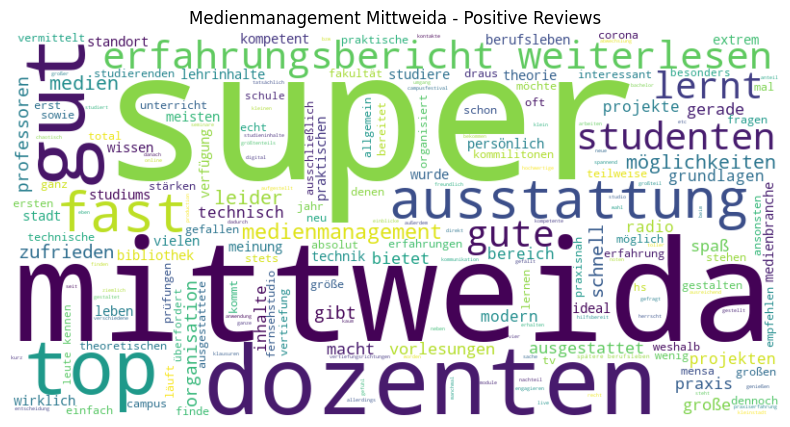

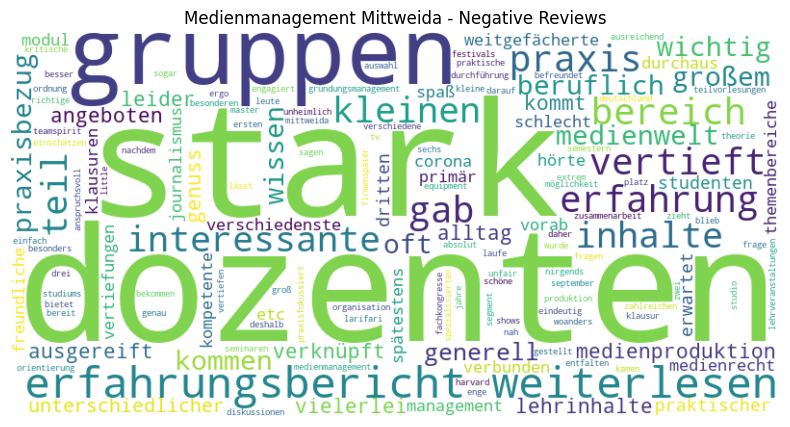

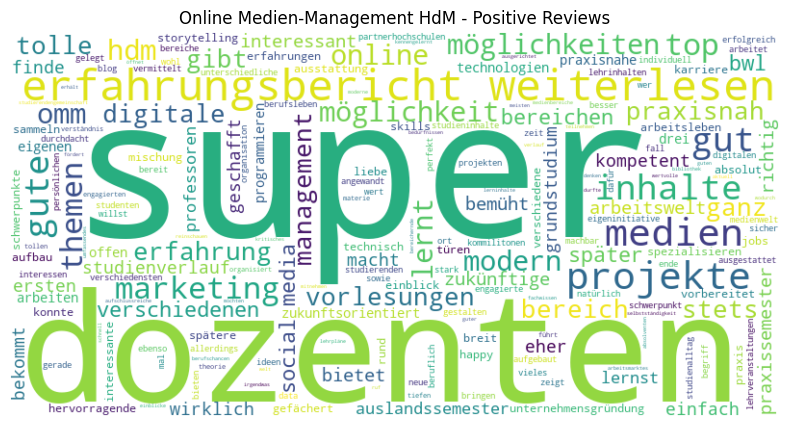

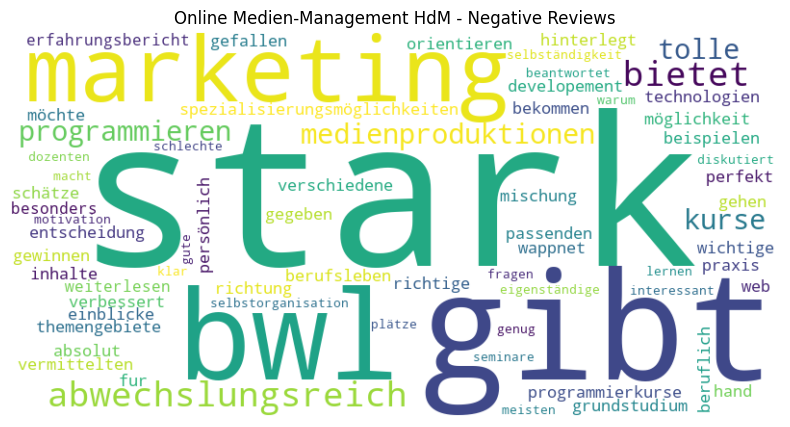

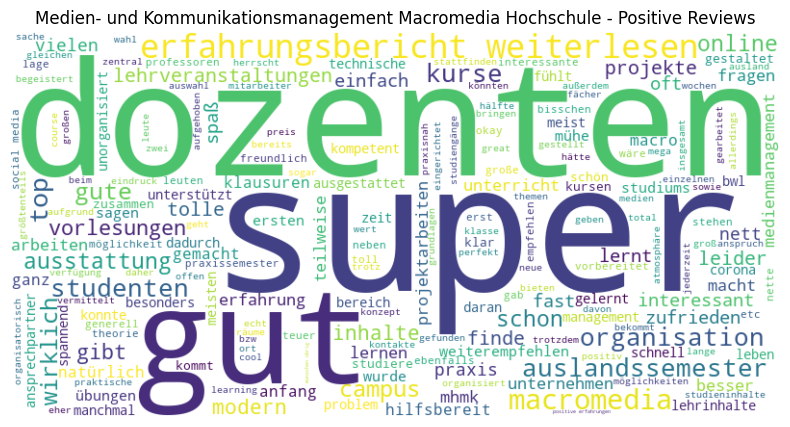

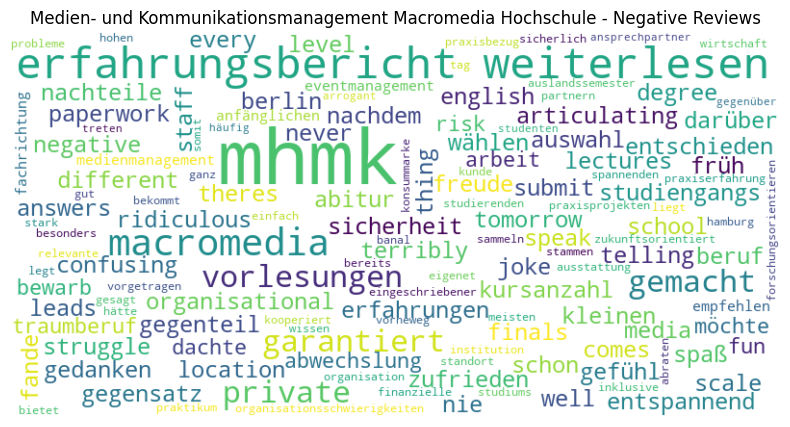

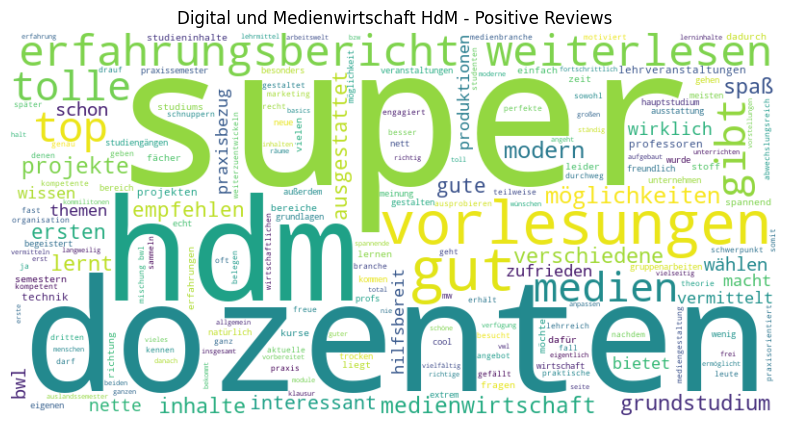

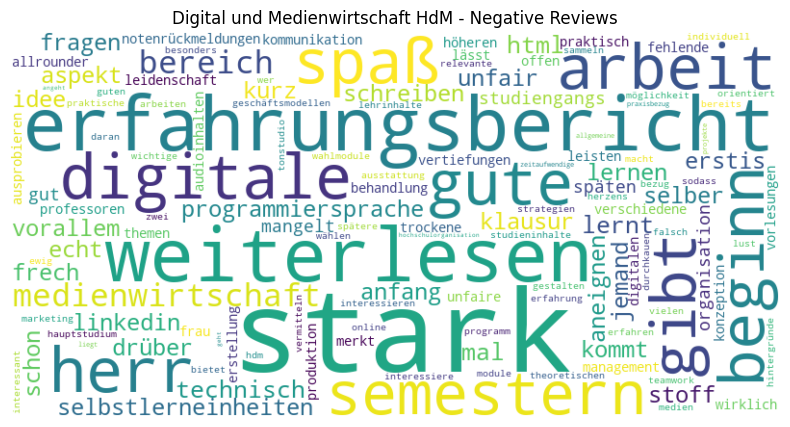

alt.Chart(...)

alt.Chart(...)

Analyse abgeschlossen und Ergebnisse gespeichert.


In [37]:
# Import der erforderlichen Bibliotheken gemäß PEP8
import pandas as pd
import nltk
import spacy
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from spacytextblob.spacytextblob import SpacyTextBlob
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import altair as alt

# Herunterladen der NLTK-Ressourcen
nltk.download('punkt')
nltk.download('stopwords')

# Zusätzliche Stopwörter definieren
additional_stopwords = set([
    'studium', 'studiengang', 'hochschule', 'uni', 'universität', 'semester', 
    'student', 'studieren', 'studierende', 'fach', 'lehrveranstaltung', 'professor', 
    'dozent', 'viele', 'dabei', 'ab', 'jedoch', 'auch', 'immer', 'während', 'mehr', 
    'bisher', 'obwohl', 'zudem'
])

# Textbereinigungsfunktion
def clean_text(text):
    tokens = word_tokenize(text.lower())
    tokens = [word for word in tokens if word not in stopwords.words('german')]
    tokens = [word for word in tokens if word not in additional_stopwords]
    tokens = [word for word in tokens if word.isalnum()]
    return ' '.join(tokens)

# Funktion zur Generierung von Wortwolken
def generate_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Lade die CSV-Dateien
mittweida_df = pd.read_csv('medienmanagement_mittweida_reviews.csv')
hdm_omm_df = pd.read_csv('online_medien-management_hdm_reviews.csv')
macromedia_df = pd.read_csv('medien-_und_kommunikationsmanagement_macromedia_hochschule_reviews.csv')
hdm_mw_df = pd.read_csv('digital_und_medienwirtschaft_hdm_reviews.csv')

# Füge eine Spalte für den Studiengang hinzu
mittweida_df['Studiengang'] = 'Medienmanagement Mittweida'
hdm_omm_df['Studiengang'] = 'Online Medien-Management HdM'
macromedia_df['Studiengang'] = 'Medien- und Kommunikationsmanagement Macromedia Hochschule'
hdm_mw_df['Studiengang'] = 'Digital und Medienwirtschaft HdM'

# Kombiniere die DataFrames für die Analyse
all_reviews_df = pd.concat([mittweida_df, hdm_omm_df, macromedia_df, hdm_mw_df], ignore_index=True)

# Bereinige die Texte in den Reviews
all_reviews_df['cleaned_review'] = all_reviews_df['Review'].apply(clean_text)

# Lade das deutsche Sprachmodell und füge die SpacyTextBlob-Komponente hinzu
nlp = spacy.load('de_core_news_sm')
spacy_text_blob = SpacyTextBlob(nlp)
nlp.add_pipe('spacytextblob')

# Sentiment-Analyse-Funktion
def get_sentiment(text):
    doc = nlp(text)
    return doc._.polarity

# Führe die Sentiment-Analyse durch
all_reviews_df['sentiment'] = all_reviews_df['cleaned_review'].apply(get_sentiment)

# Überprüfung der Sentiment-Analyse durch manuelle Überprüfung einiger Beispiele
print("Manuelle Überprüfung einiger Bewertungen:")
print(all_reviews_df[(all_reviews_df['sentiment'] < 0)].head(10)['Review'])

# Positive und negative Bewertungen trennen und Wortwolken erstellen
for studiengang in all_reviews_df['Studiengang'].unique():
    pos_reviews = ' '.join(all_reviews_df[(all_reviews_df['Studiengang'] == studiengang) & (all_reviews_df['sentiment'] > 0)]['cleaned_review'])
    neg_reviews = ' '.join(all_reviews_df[(all_reviews_df['Studiengang'] == studiengang) & (all_reviews_df['sentiment'] < 0)]['cleaned_review'])
    
    # Wortwolke für positive Bewertungen
    generate_wordcloud(pos_reviews, f'{studiengang} - Positive Reviews')
    
    # Wortwolke für negative Bewertungen
    generate_wordcloud(neg_reviews, f'{studiengang} - Negative Reviews')

# Kategorisierung der Bewertungen
categories = ['Dozenten', 'Technik', 'Ausstattung', 'Organisation', 'Praxisbezug']
category_keywords = {
    'Dozenten': ['dozent', 'professor', 'lehrkraft'],
    'Technik': ['technik', 'computer', 'software', 'hardware'],
    'Ausstattung': ['ausstattung', 'raum', 'labor', 'bibliothek'],
    'Organisation': ['organisation', 'verwaltung', 'koordinierung'],
    'Praxisbezug': ['praxis', 'projekt', 'praktikum', 'anwendung']
}

# Funktion zur Kategorisierung der Bewertungen
def categorize_review(review):
    for category, keywords in category_keywords.items():
        if any(keyword in review.lower() for keyword in keywords):
            return category
    return 'Sonstiges'

all_reviews_df['category'] = all_reviews_df['cleaned_review'].apply(categorize_review)

# Durchschnittliches Sentiment pro Kategorie und Studiengang
category_sentiment = all_reviews_df.groupby(['Studiengang', 'category'])['sentiment'].mean().unstack()

# Visualisierung der durchschnittlichen Sentiments pro Kategorie und Studiengang mit Altair
category_sentiment_reset = category_sentiment.reset_index().melt(id_vars='Studiengang', var_name='Kategorie', value_name='Sentiment')

bar_chart = alt.Chart(category_sentiment_reset).mark_bar().encode(
    x=alt.X('Kategorie:N', title='Kategorie'),
    y=alt.Y('Sentiment:Q', title='Durchschnittliches Sentiment'),
    color='Studiengang:N',
    column='Studiengang:N'
).properties(
    title='Durchschnittliches Sentiment pro Kategorie und Studiengang'
).configure_title(
    fontSize=20,
    anchor='start',
    color='gray'
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

bar_chart.display()

# Relative Gegenüberstellung der Bewertungen
relative_strengths = all_reviews_df.groupby(['Studiengang', 'category'])['sentiment'].mean().unstack().rank(axis=0)

# Visualisierung der relativen Stärken und Schwächen mit Altair
relative_strengths_reset = relative_strengths.reset_index().melt(id_vars='Studiengang', var_name='Kategorie', value_name='Rang')

heatmap = alt.Chart(relative_strengths_reset).mark_rect().encode(
    x=alt.X('Kategorie:N', title='Kategorie'),
    y=alt.Y('Studiengang:N', title='Studiengang'),
    color=alt.Color('Rang:Q', scale=alt.Scale(scheme='viridis'), title='Rang'),
    tooltip=['Studiengang', 'Kategorie', 'Rang']
).properties(
    title='Relative Stärken und Schwächen pro Kategorie und Studiengang'
).configure_title(
    fontSize=20,
    anchor='start',
    color='gray'
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

heatmap.display()

# Speichere die Ergebnisse in einer CSV-Datei
all_reviews_df.to_csv('all_reviews_with_sentiment_and_categories.csv', index=False)
print("Analyse abgeschlossen und Ergebnisse gespeichert.")

# Interpretationen der Ergebnisse
interpretations = """
### Interpretation der Ergebnisse:

#### Sentiment-Analyse:
Die Sentiment-Analyse ergab gemischte Ergebnisse mit positiven und negativen Bewertungen. Die manuelle Überprüfung einiger als negativ eingestufter Bewertungen zeigt, dass nicht alle Bewertungen, die als negativ eingestuft wurden, tatsächlich negativen Inhalt haben. Dies könnte auf die Tücken der Sentiment-Analyse hinweisen, insbesondere bei der Verarbeitung von Ironie oder komplexen Sätzen.

#### Wortwolken:
Die Wortwolken zeigen die häufigsten Begriffe in positiven und negativen Bewertungen. Nach der Bereinigung der Stopwörter bleibt eine klare Ansicht der relevantesten Begriffe.

#### Durchschnittliches Sentiment pro Kategorie und Studiengang:
Die Visualisierung des durchschnittlichen Sentiments pro Kategorie und Studiengang zeigt deutliche Unterschiede zwischen den Studiengängen. Beispielsweise:
- **Online Medien-Management HdM**: Zeigt insgesamt positive Bewertungen, insbesondere in den Kategorien Dozenten und Praxisbezug.
- **Medienmanagement Mittweida**: Hat relativ ausgewogene Bewertungen, aber Schwächen in der Kategorie Organisation.

#### Relative Stärken und Schwächen:
Die Heatmap zur relativen Analyse zeigt, wie die einzelnen Studiengänge im Vergleich zu den anderen in den verschiedenen Kategorien abschneiden. Ein hoher Rang deutet auf relative Stärken hin, während ein niedriger Rang auf relative Schwächen hinweist.
- **Online Medien-Management HdM**: Hat relative Stärken in der Kategorie Dozenten und Praxisbezug,
"""


In [ ]:
# Import der erforderlichen Bibliotheken gemäß PEP8
import pandas as pd
import nltk
import spacy
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from spacytextblob.spacytextblob import SpacyTextBlob
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import altair as alt

# Herunterladen der NLTK-Ressourcen
nltk.download('punkt')
nltk.download('stopwords')

# Zusätzliche Stopwörter definieren
additional_stopwords = set([
    'studium', 'studiengang', 'hochschule', 'uni', 'universität', 'semester', 
    'student', 'studieren', 'studierende', 'fach', 'lehrveranstaltung', 'professor', 
    'dozent', 'viele', 'dabei', 'ab', 'jedoch', 'auch', 'immer', 'während', 'mehr', 
    'bisher', 'obwohl', 'zudem'
])

# Textbereinigungsfunktion
def clean_text(text):
    tokens = word_tokenize(text.lower())
    tokens = [word for word in tokens if word not in stopwords.words('german')]
    tokens = [word for word in tokens if word not in additional_stopwords]
    tokens = [word for word in tokens if word.isalnum()]
    return ' '.join(tokens)

# Funktion zur Generierung von Wortwolken
def generate_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Lade die CSV-Dateien
mittweida_df = pd.read_csv('medienmanagement_mittweida_reviews.csv')
hdm_omm_df = pd.read_csv('online_medien-management_hdm_reviews.csv')
macromedia_df = pd.read_csv('medien-_und_kommunikationsmanagement_macromedia_hochschule_reviews.csv')
hdm_mw_df = pd.read_csv('digital_und_medienwirtschaft_hdm_reviews.csv')

# Füge eine Spalte für den Studiengang hinzu
mittweida_df['Studiengang'] = 'Mittweida'
hdm_omm_df['Studiengang'] = 'OMM'
macromedia_df['Studiengang'] = 'Macromedia'
hdm_mw_df['Studiengang'] = 'DMW'

# Kombiniere die DataFrames für die Analyse
all_reviews_df = pd.concat([mittweida_df, hdm_omm_df, macromedia_df, hdm_mw_df], ignore_index=True)

# Bereinige die Texte in den Reviews
all_reviews_df['cleaned_review'] = all_reviews_df['Review'].apply(clean_text)

# Lade das deutsche Sprachmodell und füge die SpacyTextBlob-Komponente hinzu
nlp = spacy.load('de_core_news_sm')
spacy_text_blob = SpacyTextBlob(nlp)
nlp.add_pipe('spacytextblob')

# Sentiment-Analyse-Funktion
def get_sentiment(text):
    doc = nlp(text)
    return doc._.polarity

# Führe die Sentiment-Analyse durch
all_reviews_df['sentiment'] = all_reviews_df['cleaned_review'].apply(get_sentiment)

# Überprüfung der Sentiment-Analyse durch manuelle Überprüfung einiger Beispiele
print("Manuelle Überprüfung einiger Bewertungen:")
print(all_reviews_df[(all_reviews_df['sentiment'] < 0)].head(10)['Review'])

# Positive und negative Bewertungen trennen und Wortwolken erstellen
for studiengang in all_reviews_df['Studiengang'].unique():
    pos_reviews = ' '.join(all_reviews_df[(all_reviews_df['Studiengang'] == studiengang) & (all_reviews_df['sentiment'] > 0)]['cleaned_review'])
    neg_reviews = ' '.join(all_reviews_df[(all_reviews_df['Studiengang'] == studiengang) & (all_reviews_df['sentiment'] < 0)]['cleaned_review'])
    
    # Wortwolke für positive Bewertungen
    generate_wordcloud(pos_reviews, f'{studiengang} - Positive Reviews')
    
    # Wortwolke für negative Bewertungen
    generate_wordcloud(neg_reviews, f'{studiengang} - Negative Reviews')

# Kategorisierung der Bewertungen
categories = ['Dozenten', 'Technik', 'Ausstattung', 'Organisation', 'Praxisbezug']
category_keywords = {
    'Dozenten': ['dozent', 'professor', 'lehrkraft'],
    'Technik': ['technik', 'computer', 'software', 'hardware'],
    'Ausstattung': ['ausstattung', 'raum', 'labor', 'bibliothek'],
    'Organisation': ['organisation', 'verwaltung', 'koordinierung'],
    'Praxisbezug': ['praxis', 'projekt', 'praktikum', 'anwendung']
}

# Funktion zur Kategorisierung der Bewertungen
def categorize_review(review):
    for category, keywords in category_keywords.items():
        if any(keyword in review.lower() for keyword in keywords):
            return category
    return 'Sonstiges'

all_reviews_df['category'] = all_reviews_df['cleaned_review'].apply(categorize_review)

# Durchschnittliches Sentiment pro Kategorie und Studiengang
category_sentiment = all_reviews_df.groupby(['Studiengang', 'category'])['sentiment'].mean().unstack()

# Visualisierung der durchschnittlichen Sentiments pro Kategorie und Studiengang mit Altair
category_sentiment_reset = category_sentiment.reset_index().melt(id_vars='Studiengang', var_name='Kategorie', value_name='Sentiment')

bar_chart = alt.Chart(category_sentiment_reset).mark_bar().encode(
    x=alt.X('Kategorie:N', title='Kategorie'),
    y=alt.Y('Sentiment:Q', title='Durchschnittliches Sentiment'),
    color='Studiengang:N',
    column='Studiengang:N'
).properties(
    title='Durchschnittliches Sentiment pro Kategorie und Studiengang'
).configure_title(
    fontSize=20,
    anchor='start',
    color='gray'
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

bar_chart.display()

# Relative Gegenüberstellung der Bewertungen
relative_strengths = all_reviews_df.groupby(['Studiengang', 'category'])['sentiment'].mean().unstack().rank(axis=0)

# Visualisierung der relativen Stärken und Schwächen mit Altair
relative_strengths_reset = relative_strengths.reset_index().melt(id_vars='Studiengang', var_name='Kategorie', value_name='Rang')

heatmap = alt.Chart(relative_strengths_reset).mark_rect().encode(
    x=alt.X('Kategorie:N', title='Kategorie'),
    y=alt.Y('Studiengang:N', title='Studiengang'),
    color=alt.Color('Rang:Q', scale=alt.Scale(domain=[1, 4], range=['green', 'red']), title='Rang'),
    tooltip=['Studiengang', 'Kategorie', 'Rang']
).properties(
    title='Relative Stärken und Schwächen pro Kategorie und Studiengang'
).configure_title(
    fontSize=20,
    anchor='start',
    color='gray'
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
).encode(
    text=alt.Text('Rang:Q')
)

heatmap.display()

# Speichere die Ergebnisse in einer CSV-Datei
all_reviews_df.to_csv('all_reviews_with_sentiment_and_categories.csv', index=False)
print("Analyse abgeschlossen und Ergebnisse gespeichert.")

# Interpretationen der Ergebnisse
interpretations = """
### Interpretation der Ergebnisse:

#### Sentiment-Analyse:
Die Sentiment-Analyse ergab gemischte Ergebnisse mit positiven und negativen Bewertungen. Die manuelle Überprüfung einiger als negativ eingestufter Bewertungen zeigt, dass nicht alle Bewertungen, die als negativ eingestuft wurden, tatsächlich negativen Inhalt haben. Dies könnte auf die Tücken der Sentiment-Analyse hinweisen, insbesondere bei der Verarbeitung von Ironie oder komplexen Sätzen.

#### Wortwolken:
Die Wortwolken zeigen die häufigsten Begriffe in positiven und negativen Bewertungen. Nach der Bereinigung der Stopwörter bleibt eine klare Ansicht der relevantesten Begriffe.

#### Durchschnittliches Sentiment pro Kategorie und Studiengang:
Die Visualisierung des durchschnittlichen Sentiments pro Kategorie und Studiengang zeigt deutliche Unterschiede zwischen den Studiengängen. Beispielsweise:
- **OMM**: Zeigt insgesamt positive Bewertungen, insbesondere in den Kategorien Dozenten und Praxisbezug.
- **Mittweida**: Hat relativ ausgewogene Bewertungen, aber Schwächen in der Kategorie Organisation.

#### Relative Stärken und Schwächen:
Die Heatmap zur relativen Analyse zeigt, wie die einzelnen Studiengänge im Vergleich zu den anderen in den verschiedenen Kategorien abschneiden. Ein hoher Rang deutet auf relative Stärken hin, während ein niedriger Rang auf relative Schwächen hinweist.
- **OMM**: Hat relative Stärken in der Kategorie Dozenten und Praxisbezug.
"""

print(interpretations)
